In [1]:
#Importing Libraries
import tensorflow 
import os
import numpy as np 
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Activation
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [2]:
#Loading the list of chopin's midi files as stream 
filepath = "./input/comic/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        print(tr)
        try:
            midi = converter.parse(tr)
            all_midis.append(midi)
        except:
            continue

./input/comic/Active Planets - 夕间暮れ.mid
./input/comic/Active Planets - 言の叶.mid
./input/comic/Active Planets - 雪溶け.mid
./input/comic/ALcotハニカム - はじまりの唄.mid
./input/comic/Angel Note - 夏の終わりに.mid
./input/comic/Angel Note - 春のひだまり.mid
./input/comic/Arte Refact - 月に寄りそう乙女の夜の作法.mid
./input/comic/BURTON - 夢見草.mid
./input/comic/BURTON - 紅茶の気分なひと時.mid
./input/comic/dispatch.mid
./input/comic/Falcom Sound Team jdk - アルモリカ村.mid
./input/comic/Falcom Sound Team jdk - 阳だまりにて和む猫.mid
./input/comic/Famishin - 告白.mid
./input/comic/Famishin - 確かめ合う想い.mid
./input/comic/I've - あの时、もし君が振り返ったなら.mid
./input/comic/I've - 阳だまりの小部屋.mid
./input/comic/Kakeru Ishihama - Monologue.mid
./input/comic/Key Sounds Label - Gentle Jena ~Extended Version~.mid
./input/comic/Key Sounds Label - ムーンブライト.mid
./input/comic/luminouscore - introduction.mid
./input/comic/luminouscore nao - solitude.mid
./input/comic/MANYO - Snowflake.mid
./input/comic/MANYO - White memory.mid
./input/comic/MANYO - いつまでもあなたと一緒.mid
./input/comic/MANYO

In [3]:
#Helping function        
def extract_notes(file):
    notes = []
    pick = None
    #saved_type=(type(instrument.partitionByInstrument(file[0])))
    for j in file:
        instru = instrument.partitionByInstrument(j)
        #print(type(songs))
        if instru:
            songs = instru.parts[0].recurse()
        else:  #如果没有乐器部分，直接取note
            songs = j.flat.notes
        for element in songs:
            # 如果是 Note 类型，取音调
            # 如果是 Chord 类型，取音调的序号,存int类型比较容易处理
            if isinstance(element, note.Note):
                notes.append(str(element.pitch))
            elif isinstance(element, chord.Chord):
                notes.append('.'.join(str(n) for n in element.normalOrder))

    return notes
#Getting the list of notes as Corpus
Corpus= extract_notes(all_midis)
print("Total notes in all the Chopin midis in the dataset:", len(Corpus))

Total notes in all the Chopin midis in the dataset: 87101


In [4]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 457


In [5]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrenc for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Average recurrenc for a note in Corpus: 190.5929978118162
Most frequent note in Corpus appeared: 2437 times
Least frequent note in Corpus appeared: 1 time


In [6]:
#Getting a list of rare chords
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 100:
        m =  key
        rare_note.append(m)
        
print("Total number of notes that occur less than 100 times:", len(rare_note))

Total number of notes that occur less than 100 times: 339


In [7]:
#Eleminating the rare notes
for element in Corpus:
    if element in rare_note:
        Corpus.remove(element)

print("Length of Corpus after elemination the rare notes:", len(Corpus))

Length of Corpus after elemination the rare notes: 82416


In [8]:
# Storing all the unique characters present in my corpus to bult a mapping dic. 
symb = sorted(list(set(Corpus)))

L_corpus = len(Corpus) #length of corpus
L_symb = len(symb) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

print("Total number of characters:", L_corpus)
print("Number of unique characters:", L_symb)

Total number of characters: 82416
Number of unique characters: 303


**Encoding and Splitting the Corpus as Labels and Targets**

In [9]:
#Splitting the Corpus in equal length of strings and output target
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])
    
    
L_datapoints = len(targets)
print("Total number of sequences in the Corpus:", L_datapoints)

Total number of sequences in the Corpus: 82376


In [10]:
# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tensorflow.keras.utils.to_categorical(targets) 

**Splitting Train and Seed datasets and build the model**

In [11]:
#Taking out a subset of data to be used as seed
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
#initialize GPU for training (Nvidia GPU with CUDA)
import tensorflow as tf
gpus = tf.config.list_physical_devices("GPU")
print(gpus)
if gpus:
    gpu0 = gpus[0] #如果有多个GPU，仅使用第0个GPU
    tf.config.experimental.set_memory_growth(gpu0, True) #设置GPU显存用量按需使用
    
    tf.config.set_visible_devices([gpu0],"GPU")


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [13]:
print(X.shape)

(82376, 40, 1)


In [14]:

#Initialising the Model
model = Sequential()
#Adding layers
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Activation('relu'))
model.add(LSTM(512))
model.add(Dropout(0.1))
model.add(Dense(y.shape[1], activation='softmax'))

#Compiling the model for training  
#opt = Adam(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer="Adam")


In [15]:
#Model's Summary               
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 40, 512)           1052672   
_________________________________________________________________
activation (Activation)      (None, 40, 512)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 512)               2099200   
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 303)               155439    
Total params: 3,307,311
Trainable params: 3,307,311
Non-trainable params: 0
_________________________________________________________________


In [16]:
#Training the Model
import keras
mc = keras.callbacks.ModelCheckpoint('./saves_comic/model{epoch:03d}.h5', save_weights_only=False, period=40)
#history = model.fit(X_train, y_train, epochs=100,callbacks=[mc])
history = model.fit(X_train, y_train, batch_size=256, epochs=200,callbacks=[mc])

Epoch 1/200
258/258 [==============================] - 11s 28ms/step - loss: 4.4879
Epoch 2/200
258/258 [==============================] - 7s 27ms/step - loss: 4.4471
Epoch 3/200
258/258 [==============================] - 7s 27ms/step - loss: 4.4408
Epoch 4/200
258/258 [==============================] - 7s 27ms/step - loss: 4.4387
Epoch 5/200
258/258 [==============================] - 7s 27ms/step - loss: 4.4380
Epoch 6/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4367
Epoch 7/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4349
Epoch 8/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4344
Epoch 9/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4324
Epoch 10/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4290
Epoch 11/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4184
Epoch 12/200
258/258 [==============================] - 7s 28ms/step - loss: 4.4071


258/258 [==============================] - 8s 29ms/step - loss: 1.0676
Epoch 98/200
258/258 [==============================] - 8s 29ms/step - loss: 1.0541
Epoch 99/200
258/258 [==============================] - 8s 29ms/step - loss: 1.0173
Epoch 100/200
258/258 [==============================] - 8s 29ms/step - loss: 1.0100
Epoch 101/200
258/258 [==============================] - 8s 29ms/step - loss: 0.9986
Epoch 102/200
258/258 [==============================] - 8s 29ms/step - loss: 0.9848
Epoch 103/200
258/258 [==============================] - 8s 29ms/step - loss: 0.9441
Epoch 104/200
258/258 [==============================] - 8s 29ms/step - loss: 0.9020
Epoch 105/200
258/258 [==============================] - 8s 29ms/step - loss: 0.8701
Epoch 106/200
258/258 [==============================] - 8s 29ms/step - loss: 0.8435
Epoch 107/200
258/258 [==============================] - 8s 29ms/step - loss: 0.9227
Epoch 108/200
258/258 [==============================] - 8s 29ms/step - loss: 0.8

258/258 [==============================] - 8s 30ms/step - loss: 0.3326
Epoch 194/200
258/258 [==============================] - 8s 29ms/step - loss: 0.3355
Epoch 195/200
258/258 [==============================] - 8s 30ms/step - loss: 0.3974
Epoch 196/200
258/258 [==============================] - 8s 30ms/step - loss: 0.3619
Epoch 197/200
258/258 [==============================] - 8s 30ms/step - loss: 0.2800
Epoch 198/200
258/258 [==============================] - 8s 30ms/step - loss: 0.3901
Epoch 199/200
258/258 [==============================] - 8s 30ms/step - loss: 0.3245
Epoch 200/200
258/258 [==============================] - 8s 30ms/step - loss: 0.2603


**Plotting the learning curve for the loss function**

[Text(0.5, 0, 'Epochs')]

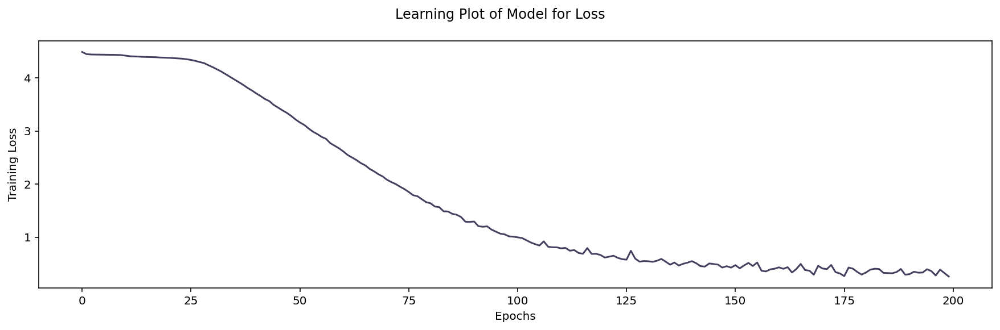

In [17]:
#Plotting the learnings 
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(15,4))
fig.suptitle("Learning Plot of Model for Loss")
pl=sns.lineplot(data=history_df["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

In [18]:
np.save("X_seed_comic.npy",X_seed)
np.save("symb_comic.npy",symb)

**Generating the Melody**

In [44]:
#Importing Libraries
import tensorflow 
import os
import numpy as np 
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import sys
import warnings
import os
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

In [45]:
#initialize GPU
import tensorflow as tf
gpus = tf.config.list_physical_devices("GPU")
print(gpus)
if gpus:
    gpu0 = gpus[0] #如果有多个GPU，仅使用第0个GPU
    tf.config.experimental.set_memory_growth(gpu0, True) #设置GPU显存用量按需使用
    
    tf.config.set_visible_devices([gpu0],"GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [46]:
from keras.models import *
model=load_model('./saves_comic/model100.h5')
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_33 (LSTM)               (None, 40, 512)           1052672   
_________________________________________________________________
activation_7 (Activation)    (None, 40, 512)           0         
_________________________________________________________________
lstm_34 (LSTM)               (None, 512)               2099200   
_________________________________________________________________
dropout_17 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 303)               155439    
Total params: 3,307,311
Trainable params: 3,307,311
Non-trainable params: 0
_________________________________________________________________


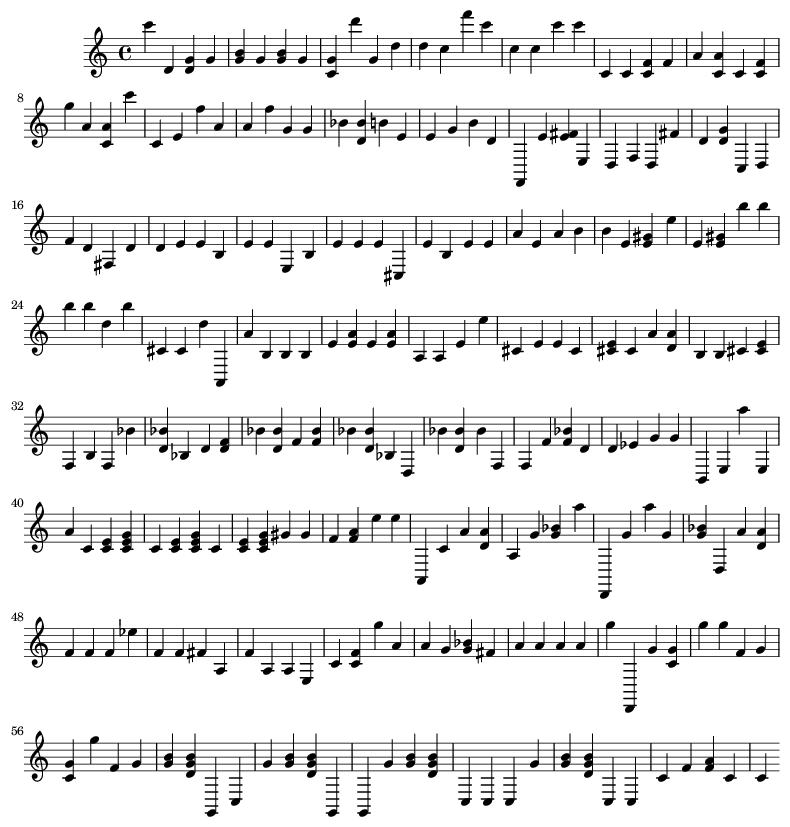

In [47]:
X_seed=np.load("./saves_comic/X_seed_comic.npy")
symb=np.load("./saves_comic/symb_comic.npy")
length=40
L_symb=349
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = [] 
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)            
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else: 
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)   
    return Melody_midi

def Malody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)   
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)   
    return Music,Melody_midi


#getting the Notes and Melody created by the model
Music_notes, Melody = Malody_Generator(200)
display(Image(str(Melody.write("lily.png"))))

**Generated Sample 1**

In [48]:
#To save the generated melody
Melody.write('midi','music_Generated_comic.mid')

#transfer to wav
from midi2audio import FluidSynth

soundfont="Essential_Keys-sforzando-v9.6.sf2"
fs = FluidSynth(sound_font=soundfont, sample_rate=22050)

#fs.play_midi('music_Generated.mid')

fs.midi_to_audio('music_Generated_comic.mid', 'music_Generated_comic.wav')

#to play audio or corpus
IPython.display.Audio("music_Generated.wav")